## Objective: Main aim of this notebook is to generate face behind the mask using autoencoder.

## Import Necessary Libraries

In [1]:
import tensorflow as tf
import tensorflow.keras as keras
from keras.layers import Dense, Conv2D, MaxPool2D, UpSampling2D, Dropout, Input
from keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm 
import numpy as np
import os
import re
from skimage.measure import compare_ssim
from scipy import ndimage
import random


import extra modules

In [2]:
from keras.engine import  Model
from keras.layers import Input

In [3]:
!pip install image-quality
import imquality.brisque as brisque

     |████████████████████████████████| 146 kB 412 kB/s 
     |████████████████████████████████| 170 kB 1.6 MB/s 
  Created wheel for libsvm: filename=libsvm-3.23.0.4-cp37-cp37m-linux_x86_64.whl size=244139 sha256=7e36bd0791a86dce248a9dd6a1124f740cd6195e2801e7e81045b4ba471c0cba
  Stored in directory: /root/.cache/pip/wheels/cd/e8/1e/bf95cf256e4d3ffc94289ab508c49d48e34c98220af63e3513
Successfully built libsvm
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


## Load data
Here I am going to load only ~1000 images each with mask and no mask (we tested it on kaggle with limited resources). These images are converted to an array and are appended in empty array. Here I also have defind function to load data serially. 

In [4]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)


# defining the size of image 
SIZE = 256

mask_path = '../input/face-mask-lite-dataset/with_mask'
mask_array = []

image_path = '../input/face-mask-lite-dataset/without_mask'
img_array = []

image_file = sorted_alphanumeric(os.listdir(image_path))
mask_file = sorted_alphanumeric(os.listdir(mask_path))

        
for i in tqdm(image_file):
 
    if i == 'seed1000.png':
        break
    
    else:
        image = cv2.imread(image_path + '/' + i,1)

        # as opencv load image in bgr format converting it to rgb
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # resizing images 
        image = cv2.resize(image, (SIZE, SIZE))

        # normalizing image 
        image = image.astype('float32') / 255.0
        # appending normal sketch image
        img_array.append(img_to_array(image))
    

 10%|█         | 1000/10000 [01:10<10:36, 14.15it/s]


load images part 2

In [5]:
for i in tqdm(mask_file):
    if i == 'with-mask-default-mask-seed1000.png':
        break
    else:    
        image = cv2.imread(mask_path + '/' + i,1)

          # as opencv load image in bgr format converting it to rgb
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # resizing images 
        image = cv2.resize(image, (SIZE, SIZE))

        # normalizing image 
        image = image.astype('float32') / 255.0

        #appending normal normal image    
        mask_array.append(img_to_array(image))

 10%|█         | 1000/10000 [01:06<09:55, 15.11it/s]


## Plot image pair

## Slicing and reshaping
Here i have used 80% images for training and remaining 20% for testing.

In [6]:
n = int(len(mask_array)*0.8)
train_mask_image = mask_array[:n]
train_image = img_array[:n]
test_mask_image = mask_array[n:]
test_image = img_array[n:]

# reshaping
train_mask_image = np.reshape(train_mask_image,(len(train_mask_image),SIZE,SIZE,3))
train_image = np.reshape(train_image, (len(train_image),SIZE,SIZE,3))
print('Train no mask image shape:',train_image.shape)
test_mask_image = np.reshape(test_mask_image,(len(test_mask_image),SIZE,SIZE,3))
test_image = np.reshape(test_image, (len(test_image),SIZE,SIZE,3))
print('Test no mask image shape',test_image.shape)

Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)


**inactive code for mask extraction as a stage**

In [7]:
if 0:
    mask_region = [i==r for (i,r) in zip(mask_array, img_array)]

    mask_region = [tf.reduce_all(x,axis=2) for x in mask_region]
    mask_region = [tf.stack([tf.logical_not(x),x],axis=2) for x in mask_region]
    mask_region_float = tf.reshape([tf.reshape(m,(SIZE,SIZE,2)) for m in mask_region], (len(mask_region),SIZE,SIZE,2))


    print(img_array[0][:,:,1] - tf.cast(mask_region_float[0,:,:,1],dtype='float'))
    plt.imshow(img_array[0][:,:,0] -  tf.cast(mask_region_float[0,:,:,1],dtype='float'))
    plt.show()
    print(mask_region_float.shape)

image editing functions:
all the functions are supposed to sum up the various distortion types you can get in an image.
    1. blurring from a random size gaussian kernel
    2. median filtering
    3. image rotation
    4. image flipping - tricky for learning, as you cannot know if image was flipped.
    5. salt & pepper noise added
    6. shot noise - poisson noise - on a random scale.
    7. darken Im - makes image darker
    8. brighten im - " brighter.
    9. change colour - sqitches between the colour ordering, distorts colouring.
each image gets 3 "edits".

In [8]:
def blurImage(im):
    k = random.randint(1,3)
    k = k * 2 + 1
    res = cv2.GaussianBlur(im,(k,k),0)
    return res

def medFilt(im):
    res = np.uint8(im*256)
    res = cv2.medianBlur(res,5)
    return res

def rotImage(im):   
    #rotation angle in degree
    (h, w) = im.shape[:2]
    (cX, cY) = (w // 2, h // 2)
    deg = random.random() - 0.5
    isflip = random.random()
    M = cv2.getRotationMatrix2D((cX, cY), 20*deg, 1.0)
    res = cv2.warpAffine(im, M, (w, h))
    
    if isflip>0.5:
        res = flipImage(res)
    return res

def flipImage(im):
    res = np.fliplr(im)
    return res

def saltPImage(im):
    (h, w) = image.shape[:2]
    sc = random.random()
    m = np.random.normal(scale=sc/2,size = (h,w,3))
    res = im + m
    return res

def shotNoise(im):
    (h, w) = image.shape[:2]
    rng = np.random.default_rng()
    sc = random.random() / 10
    s = rng.poisson(sc, (h,w,3)) - sc
    res = im + s
    return res

def darkenIm(im):
    factor = random.random()
    res = im * (0.5+factor/2)
    return res

def brightenIm(im):
    factor = random.random()
    factor = factor / 2 + 0.5
    res = im / factor
    return res

def changeColour(im):
    order = np.random.permutation(range(3))
    res = im[:,:,[order[0], order[1], order[2]]]
    return res

def edit_images(mask_array):
    mask_array_edit = mask_array.copy()
    for iter in range(3):
        for ind in tqdm(range(len(mask_array))):
            im = mask_array_edit[ind]
            alg = random.random()
            if alg < 0.1:
                res = im
            elif alg < 0.2 and alg > 0.1:
                res = blurImage(im)
                res = im
            elif alg < 0.3 and alg > 0.2:
                # res = medFilt(im)
                res = im
            elif alg < 0.4 and alg > 0.3:
                res = rotImage(im)
            elif alg < 0.5 and alg > 0.4:
                res = saltPImage(im)
            elif alg < 0.6 and alg > 0.5:
                res = changeColour(im)
            elif alg < 0.7 and alg > 0.6:
                res = darkenIm(im)
            elif alg < 0.8 and alg > 0.7:
                res = shotNoise(im)
            elif alg < 0.9 and alg > 0.8:
                res = im
                res = brightenIm(im)
            else:
                res = flipImage(im)
            mask_array_edit[ind] = res
    n = int(np.round(len(mask_array_edit)*0.8))
    mask_array_edit_tr = mask_array_edit[:n]
    mask_array_edit_te = mask_array_edit[n:]

    mask_array_edit_tr = np.reshape(mask_array_edit_tr,(len(mask_array_edit_tr),SIZE,SIZE,3))
    print('Train no mask image shape:',mask_array_edit_tr.shape)

    mask_array_edit_te = np.reshape(mask_array_edit_te,(len(mask_array_edit_te),SIZE,SIZE,3))
    print('Test no mask image shape',mask_array_edit_te.shape)
    return mask_array_edit_tr,mask_array_edit_te, mask_array_edit

mask_array_edit_tr,mask_array_edit_te, mask_array_edit = edit_images(mask_array)

100%|██████████| 1000/1000 [00:01<00:00, 692.37it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)


display of images comparison, to see has been achieved.

In [9]:
def plot_image_pair(images = 5):
    for i in range(images):
        plt.figure(figsize = (7,7))
        plt.subplot(1,3,1)
        plt.title("No Mask", fontsize = 15)
        plt.imshow(img_array[i].reshape(SIZE, SIZE, 3))
        plt.subplot(1,3,2)
        plt.title("Mask", fontsize = 15)
        plt.imshow(mask_array[i].reshape(SIZE, SIZE, 3))
        plt.subplot(1,3,3)
        plt.title("Mask", fontsize = 15)
        plt.imshow(mask_array_edit[i].reshape(SIZE, SIZE, 3))


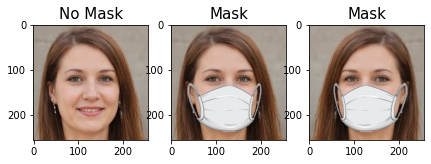

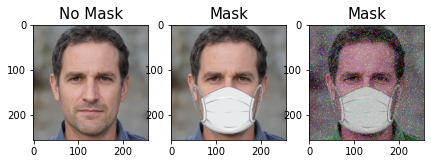

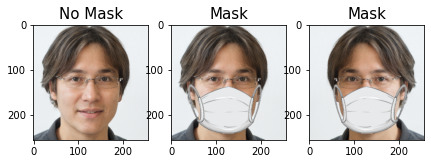

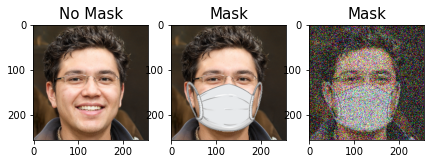

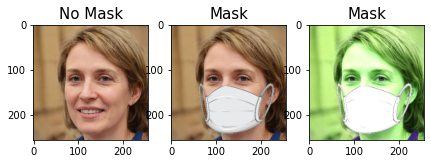

...

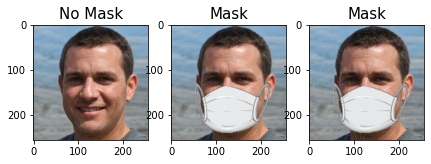

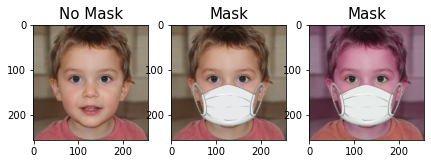

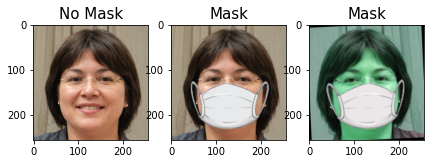

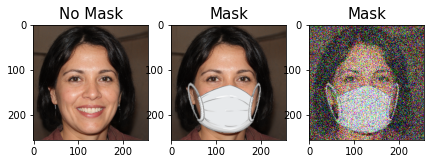

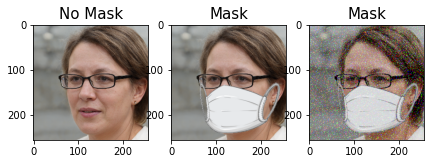

In [10]:
plot_image_pair(20)

## Defining our model

encoder-decoder U-net infrastructure.

In [11]:
encoder_input = keras.Input(shape=(SIZE,SIZE, 3), name="img")
x = Conv2D(filters = 16, kernel_size = (3,3), activation = 'relu', padding = 'same')(encoder_input)
x = MaxPool2D(pool_size = (2,2))(x)

x = Conv2D(filters = 32,kernel_size = (3,3),strides = (2,2), activation = 'relu', padding = 'valid')(x)
x = Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), activation = 'relu', padding = 'same')(x)
x = MaxPool2D(pool_size = (2,2))(x)

x = Conv2D(filters = 64, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = Conv2D(filters = 128, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = Conv2D(filters = 128 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x) 
x = Conv2D(filters = 256 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x) 
encoder_output = Conv2D(filters = 512 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x) 
encoder = tf.keras.Model(encoder_input, encoder_output)

decoder_input = Conv2D(filters = 512 ,kernel_size = (3,3), activation = 'relu', padding = 'same')(encoder_output)
x = UpSampling2D(size = (2,2))(decoder_input)
x = Conv2D(filters = 256, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = Conv2D(filters = 128, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = Conv2D(filters = 128, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = Conv2D(filters = 164, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = UpSampling2D(size = (2,2) )(x)

x = Conv2D(filters = 64, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = UpSampling2D(size = (2,2) )(x)
x = Conv2D(filters = 32 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
x = UpSampling2D(size = (2,2) )(x)
 
x = Conv2D(filters = 16  , kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
decoder_output = Conv2D(filters = 3, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)

# final model
model = keras.Model(encoder_input, decoder_output)
model.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
img (InputLayer)             [(None, 256, 256, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 256, 256, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 63, 63, 32)        4640      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 64)       

## Compiling our model

untrained model display, to make sure everythings initialized.

(256, 256, 3)


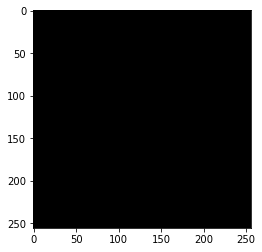

In [12]:
    print(train_image[0].shape) 
    prediction = model.predict(tf.reshape(train_image[1],(-1,256,256,3)))
    plt.imshow(tf.squeeze(prediction))
    plt.show()

second display function. uses model to predict images, and is used to compare model's performance

In [13]:
print(train_image.dtype)
def plot_images(start = 0, end = 5):
    #  os.mkdir('/kaggle/working/comps')
    for i in range(start, end, 1):
        plt.figure(figsize = (10,10))
        plt.subplot(1,3,1)
        plt.title("No Mask", fontsize = 12)
        plt.imshow(test_image[i])
        plt.subplot(1,3,2)
        plt.title("Mask", fontsize = 12)
        plt.imshow(mask_array_edit_te[i])
        plt.subplot(1,3,3)
        plt.title("Predicted", fontsize = 12)
        prediction = model.predict(tf.reshape(tf.keras.backend.constant(mask_array_edit_te[i]),
                                              (-1,256,256,3)))
        plt.imshow(tf.squeeze(prediction))
        
        #  plt.savefig('comps'+os.sep+'test img:'+str(i)+'.tiff')
        plt.show()
        

float32


model training and compilation.
we use 5 rounds of training, where each round new images are edited so as to keep model from overfitting.

100%|██████████| 1000/1000 [00:01<00:00, 628.45it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)
Epoch 1/15
20/20 [==============================] - 3s 154ms/step - loss: 0.3568 - acc: 0.6245 - val_loss: 0.2023 - val_acc: 0.1044
Epoch 2/15
20/20 [==============================] - 3s 133ms/step - loss: 0.1009 - acc: 0.2664 - val_loss: 0.0523 - val_acc: 0.8731
Epoch 3/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0539 - acc: 0.8635 - val_loss: 0.0518 - val_acc: 0.8731
Epoch 4/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0525 - acc: 0.8635 - val_loss: 0.0509 - val_acc: 0.8731
Epoch 5/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0524 - acc: 0.8635 - val_loss: 0.0514 - val_acc: 0.8731
Epoch 6/15
20/20 [==============================] - 3s 140ms/step - loss: 0.0519 - acc: 0.8635 - val_loss: 0.0488 - val_acc: 0.8731
Epoch 7/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0467 - acc: 0.8635 - val_loss: 0.0407 - va

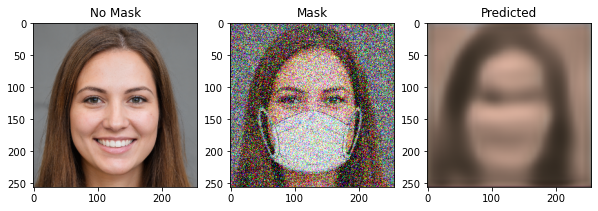

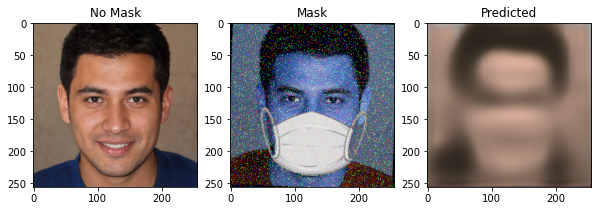

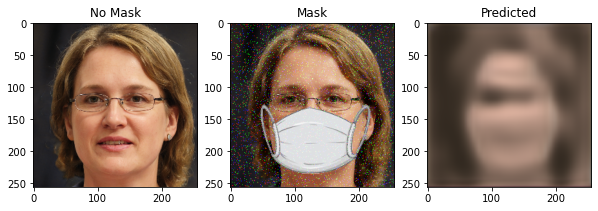

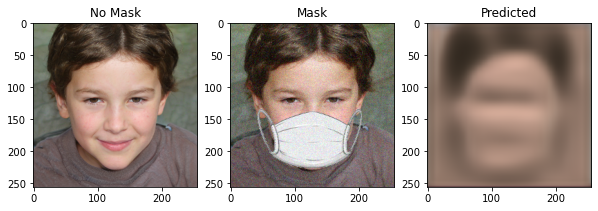

7/7 [==============================] - 1s 72ms/step - loss: 0.0268 - acc: 0.8606


  5%|▍         | 47/1000 [00:00<00:02, 468.35it/s]

test loss, test acc: [0.026836715638637543, 0.860612690448761]
----0-----


100%|██████████| 1000/1000 [00:01<00:00, 604.89it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)
Epoch 1/15
20/20 [==============================] - 3s 146ms/step - loss: 0.0236 - acc: 0.8558 - val_loss: 0.0240 - val_acc: 0.8625
Epoch 2/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0227 - acc: 0.8523 - val_loss: 0.0233 - val_acc: 0.8401
Epoch 3/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0220 - acc: 0.8535 - val_loss: 0.0245 - val_acc: 0.8529
Epoch 4/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0209 - acc: 0.8513 - val_loss: 0.0219 - val_acc: 0.8616
Epoch 5/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0209 - acc: 0.8515 - val_loss: 0.0216 - val_acc: 0.8442
Epoch 6/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0203 - acc: 0.8497 - val_loss: 0.0213 - val_acc: 0.8610
Epoch 7/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0199 - acc: 0.8538 - val_loss: 0.0205 - va

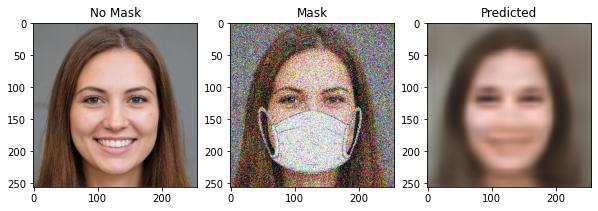

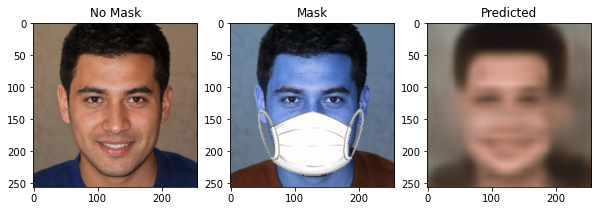

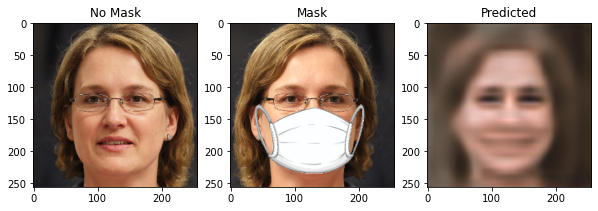

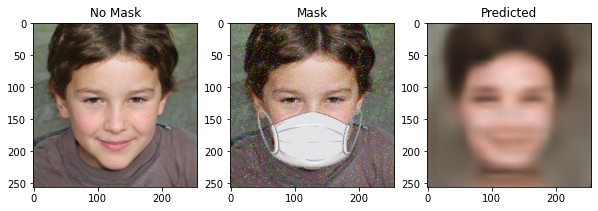

7/7 [==============================] - 0s 36ms/step - loss: 0.0200 - acc: 0.8418


  0%|          | 0/1000 [00:00<?, ?it/s]

test loss, test acc: [0.020013488829135895, 0.8417606353759766]
----1-----


100%|██████████| 1000/1000 [00:01<00:00, 555.92it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)
Epoch 1/15
20/20 [==============================] - 3s 146ms/step - loss: 0.0194 - acc: 0.8491 - val_loss: 0.0187 - val_acc: 0.8471
Epoch 2/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0183 - acc: 0.8522 - val_loss: 0.0184 - val_acc: 0.8610
Epoch 3/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0180 - acc: 0.8545 - val_loss: 0.0181 - val_acc: 0.8485
Epoch 4/15
20/20 [==============================] - 3s 132ms/step - loss: 0.0176 - acc: 0.8498 - val_loss: 0.0176 - val_acc: 0.8577
Epoch 5/15
20/20 [==============================] - 3s 141ms/step - loss: 0.0171 - acc: 0.8508 - val_loss: 0.0177 - val_acc: 0.8382
Epoch 6/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0168 - acc: 0.8527 - val_loss: 0.0175 - val_acc: 0.8637
Epoch 7/15
20/20 [==============================] - 3s 132ms/step - loss: 0.0166 - acc: 0.8553 - val_loss: 0.0175 - va

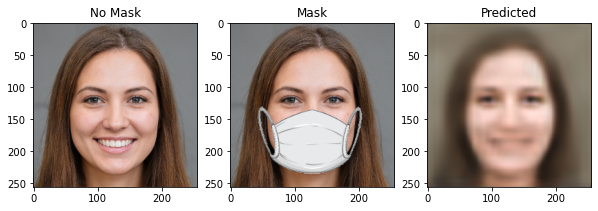

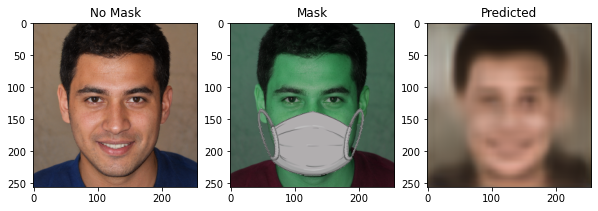

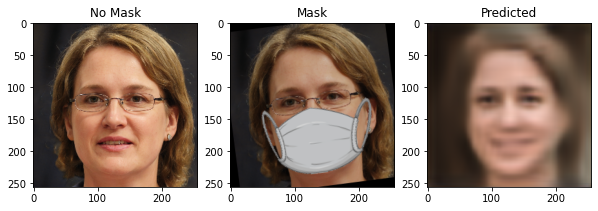

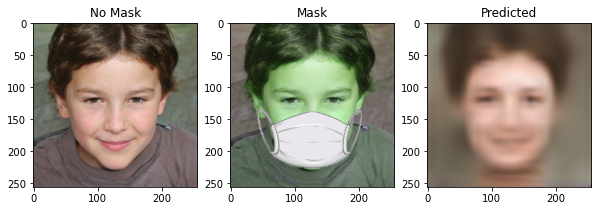

7/7 [==============================] - 0s 41ms/step - loss: 0.0203 - acc: 0.8497


  0%|          | 0/1000 [00:00<?, ?it/s]

test loss, test acc: [0.020281877368688583, 0.8496717810630798]
----2-----


100%|██████████| 1000/1000 [00:01<00:00, 668.81it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)
Epoch 1/15
20/20 [==============================] - 3s 142ms/step - loss: 0.0172 - acc: 0.8558 - val_loss: 0.0175 - val_acc: 0.8605
Epoch 2/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0163 - acc: 0.8524 - val_loss: 0.0171 - val_acc: 0.8660
Epoch 3/15
20/20 [==============================] - 3s 132ms/step - loss: 0.0161 - acc: 0.8568 - val_loss: 0.0172 - val_acc: 0.8539
Epoch 4/15
20/20 [==============================] - 3s 132ms/step - loss: 0.0160 - acc: 0.8545 - val_loss: 0.0177 - val_acc: 0.8624
Epoch 5/15
20/20 [==============================] - 3s 135ms/step - loss: 0.0153 - acc: 0.8546 - val_loss: 0.0173 - val_acc: 0.8647
Epoch 6/15
20/20 [==============================] - 3s 133ms/step - loss: 0.0151 - acc: 0.8542 - val_loss: 0.0175 - val_acc: 0.8328
Epoch 7/15
20/20 [==============================] - 3s 132ms/step - loss: 0.0151 - acc: 0.8536 - val_loss: 0.0179 - va

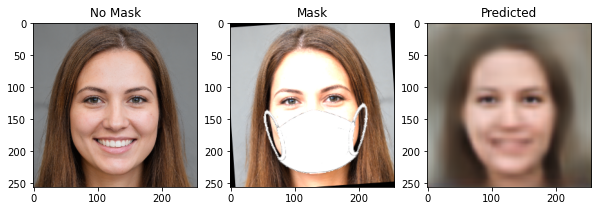

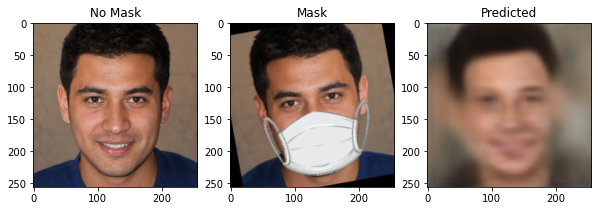

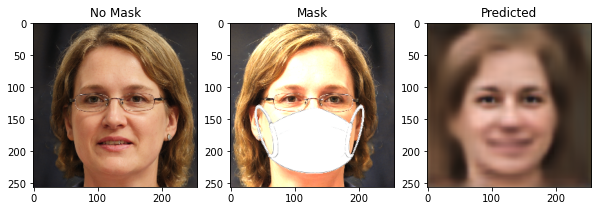

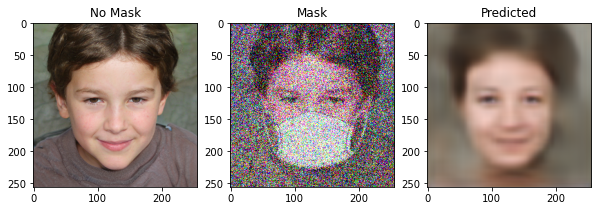

7/7 [==============================] - 0s 38ms/step - loss: 0.0167 - acc: 0.8565


  0%|          | 0/1000 [00:00<?, ?it/s]

test loss, test acc: [0.01673494093120098, 0.8565196990966797]
----3-----


100%|██████████| 1000/1000 [00:01<00:00, 634.18it/s]


Train no mask image shape: (800, 256, 256, 3)
Test no mask image shape (200, 256, 256, 3)
Epoch 1/15
20/20 [==============================] - 3s 145ms/step - loss: 0.0167 - acc: 0.8568 - val_loss: 0.0163 - val_acc: 0.8637
Epoch 2/15
20/20 [==============================] - 3s 131ms/step - loss: 0.0162 - acc: 0.8564 - val_loss: 0.0162 - val_acc: 0.8294
Epoch 3/15
20/20 [==============================] - 3s 137ms/step - loss: 0.0152 - acc: 0.8544 - val_loss: 0.0157 - val_acc: 0.8651
Epoch 4/15
20/20 [==============================] - 3s 141ms/step - loss: 0.0148 - acc: 0.8558 - val_loss: 0.0160 - val_acc: 0.8405
Epoch 5/15
20/20 [==============================] - 3s 132ms/step - loss: 0.0144 - acc: 0.8568 - val_loss: 0.0164 - val_acc: 0.8603
Epoch 6/15
20/20 [==============================] - 3s 131ms/step - loss: 0.0141 - acc: 0.8550 - val_loss: 0.0163 - val_acc: 0.8411
Epoch 7/15
20/20 [==============================] - 3s 134ms/step - loss: 0.0139 - acc: 0.8553 - val_loss: 0.0161 - va

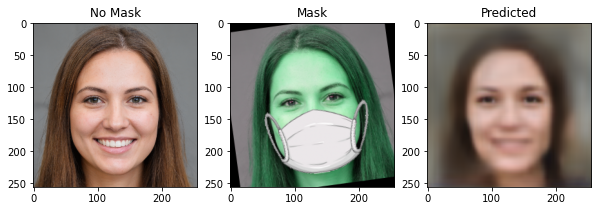

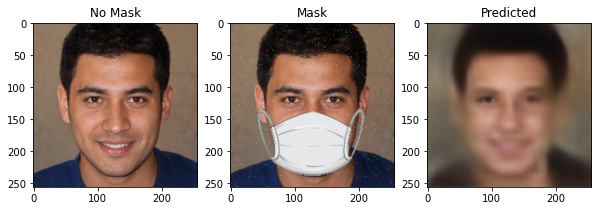

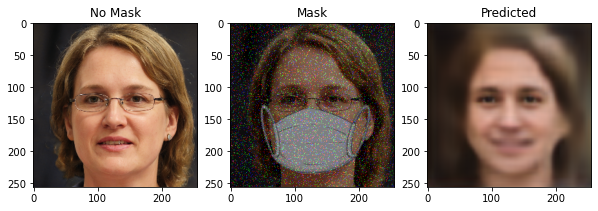

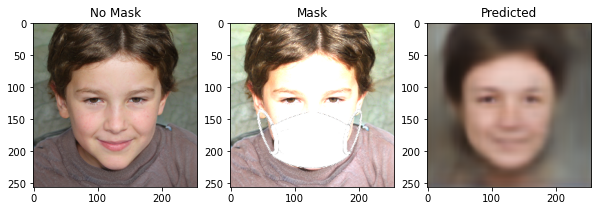

7/7 [==============================] - 0s 41ms/step - loss: 0.0175 - acc: 0.8443
test loss, test acc: [0.017492501065135002, 0.8443099856376648]
----4-----


In [14]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mse',
              metrics = ['acc'])
results=[]

for iter in range(5):
    mask_array_edit_tr,mask_array_edit_te,mask_array_edit = edit_images(mask_array)
    model.fit(mask_array_edit_tr, train_image, epochs = 15,shuffle='True',validation_split = 0.2)
    plot_images(21,25)
    results.append(model.evaluate(mask_array_edit_te, test_image, batch_size=32))
    print("test loss, test acc:", results[iter])
    print("----"+str(iter)+"-----")

## Model evaluation

In [15]:
loss_acc= model.evaluate(test_mask_image, test_image)
print("Loss: ",loss_acc[0])
print('Accuracy: ', np.round(loss_acc[1],2) * 100)

7/7 [==============================] - 0s 39ms/step - loss: 0.0121 - acc: 0.8481
Loss:  0.012091189622879028
Accuracy:  85.0


> **discriminator**

we use vgg16 as a discriminator between good and bad images.
the original filters are there as feature extractors.
we add our own layers to the top and retrain on our generated images to see what it thinks of them.

In [16]:
from keras.applications.vgg16 import VGG16
vgg_disc = VGG16(include_top=0,input_shape=(256,256,3),classes=1000) # real, fake
print(vgg_disc.summary())


58892288/58889256 [==============================] - 0s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
______________________________________________________________

our added upper layers

In [17]:
vgg_out_shape = (8,8,512)

for layer in vgg_disc.layers[:]:
    layer.trainable = False
    
discriminator = keras.Sequential()

# Add the vgg convolutional base model
discriminator.add(vgg_disc)
# Add new layers
discriminator.add(keras.layers.Flatten())
discriminator.add(Dense(128, activation='relu'))
discriminator.add(Dropout(0.5))
discriminator.add(Dense(2, activation='softmax'))
# Show a summary of the model. Check the number of trainable parameters
discriminator.summary()

discriminator.compile(loss='mae',
              optimizer=keras.optimizers.Adam(lr=1e-6),
              metrics=['acc'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 8, 8, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
dense (Dense)                (None, 128)               4194432   
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 258       
Total params: 18,909,378
Trainable params: 4,194,690
Non-trainable params: 14,714,688
_________________________________________________________________


initial prediction

In [18]:
from keras.applications.vgg16 import preprocess_input
# prepare the image for the VGG model
im = tf.reshape(preprocess_input(train_image[0]),(-1,256,256,3))

yhat = discriminator.predict(im)
print(yhat)

[[0.97235155 0.02764847]]


# > ****training of discriminator****

generation of predicted images for training of "discriminator" as a quality metric

In [19]:
gen_images = np.zeros((len(mask_array_edit),SIZE,SIZE,3))
for i in tqdm(range(len(mask_array_edit))):
    gen_images[i,:,:,:] = np.reshape(model.predict(tf.reshape(mask_array_edit[i],
                                                              (1,SIZE,SIZE,3))),(1,SIZE,SIZE,3))       

gen_images = tf.Variable(gen_images)

100%|██████████| 1000/1000 [00:38<00:00, 26.23it/s]


In [20]:
train_ims_tf = tf.Variable(np.reshape(train_image,(-1,256,256,3)))

comparison of image generation performance on test data

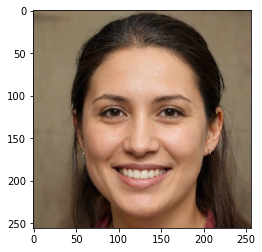

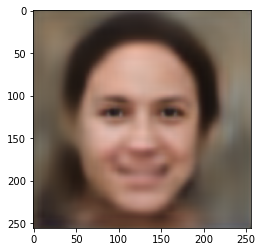

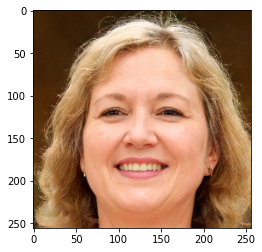

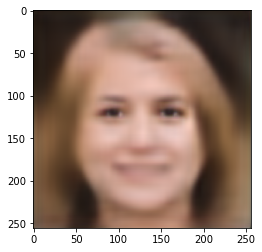

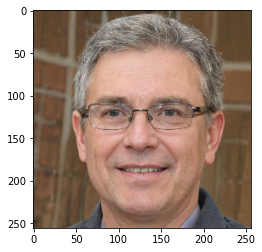

...

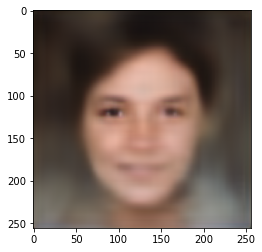

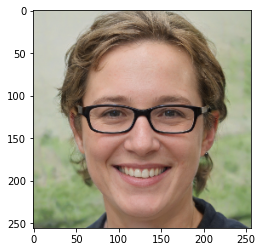

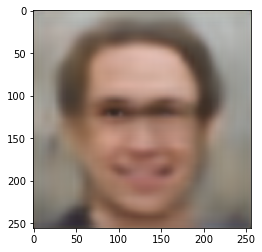

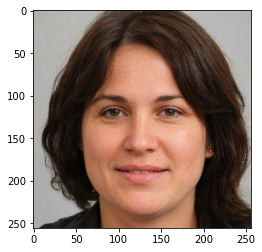

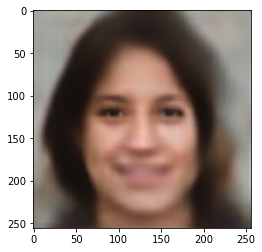

In [21]:
for i in range(10):
    plt.imshow(test_image[i])
    plt.show()
    plt.imshow(gen_images[len(train_image) + i])
    plt.show()

data creation for training

In [22]:
disc_data = tf.concat([tf.cast(gen_images,dtype='float32'), tf.cast(train_ims_tf,dtype='float32')],0)
print(tf.shape(disc_data))
nims = tf.shape(gen_images)[0]
nims2 = tf.shape(train_ims_tf)[0]

disc_tags = tf.concat([tf.concat([tf.zeros((nims,1),dtype='int32'),tf.ones((nims,1),dtype='int32')],1), 
             tf.concat([tf.ones((nims2,1),dtype='int32'),tf.zeros((nims2,1),dtype='int32')],1)],0)
print(disc_tags[0])
print(disc_tags[1500])
print(tf.shape(disc_tags))

tf.Tensor([1800  256  256    3], shape=(4,), dtype=int32)
tf.Tensor([0 1], shape=(2,), dtype=int32)
tf.Tensor([1 0], shape=(2,), dtype=int32)
tf.Tensor([1800    2], shape=(2,), dtype=int32)


"discriminator" training

In [23]:
discriminator.fit(disc_data, disc_tags,batch_size=64,epochs=10, validation_split = 0.2,shuffle='True')

Epoch 1/10
23/23 [==============================] - 6s 269ms/step - loss: 0.3661 - acc: 0.7000 - val_loss: 0.5086 - val_acc: 0.4444
Epoch 2/10
23/23 [==============================] - 4s 193ms/step - loss: 0.3043 - acc: 0.7785 - val_loss: 0.4913 - val_acc: 0.5500
Epoch 3/10
23/23 [==============================] - 4s 187ms/step - loss: 0.2531 - acc: 0.8340 - val_loss: 0.4222 - val_acc: 0.8000
Epoch 4/10
23/23 [==============================] - 4s 189ms/step - loss: 0.2162 - acc: 0.8646 - val_loss: 0.3241 - val_acc: 0.9583
Epoch 5/10
23/23 [==============================] - 4s 189ms/step - loss: 0.1659 - acc: 0.9257 - val_loss: 0.2305 - val_acc: 0.9889
Epoch 6/10
23/23 [==============================] - 4s 190ms/step - loss: 0.1335 - acc: 0.9604 - val_loss: 0.1586 - val_acc: 1.0000
Epoch 7/10
23/23 [==============================] - 4s 190ms/step - loss: 0.1112 - acc: 0.9722 - val_loss: 0.1221 - val_acc: 1.0000
Epoch 8/10
23/23 [==============================] - 4s 188ms/step - loss: 0.

Test the discriminator

create predicitions over data

In [24]:
preds = []
for i in tqdm(range(tf.shape(gen_images)[0])):
    preds.append(discriminator(tf.reshape(gen_images[i],(-1,256,256,3))))



100%|██████████| 1000/1000 [00:06<00:00, 159.27it/s]


[421 725 293 450]


/opt/conda/lib/python3.7/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


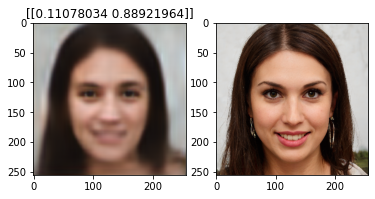

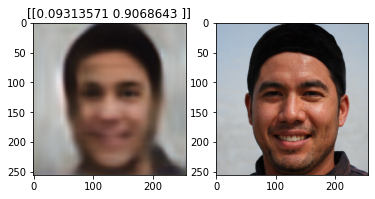

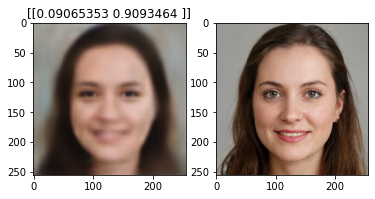

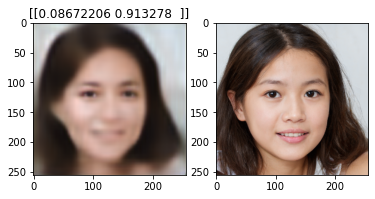

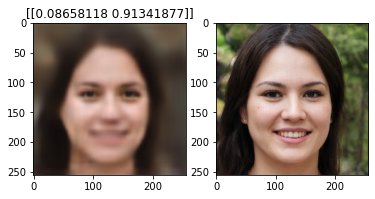

...

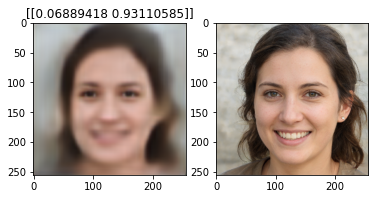

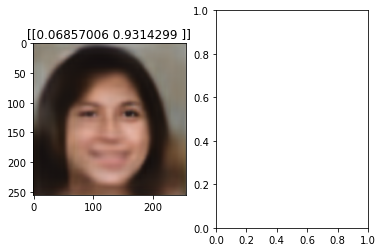

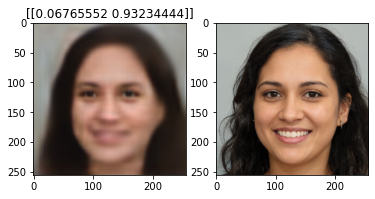

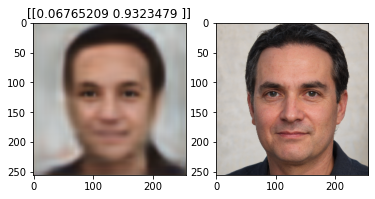

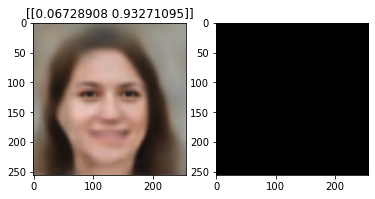

In [25]:
preds = np.asarray(preds)
vals = np.argsort(-preds[:,0][:,0])
print(vals[0:4])

for iter in range(20):
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(gen_images[vals[iter]])
    plt.title(preds[vals[iter]])
    plt.subplot(1,2,2)
    if vals[iter] < len(train_image):
        plt.imshow(train_image[vals[iter]])
        plt.show()

we attempt to train our model with discriminator as loss

In [26]:
def discLoss(img,truth):
    res1 = discriminator(img)
    res2 = discriminator(truth)
    res3 = keras.losses.MSE(img,truth)
    return tf.norm(res1-res2)*0.2 + res3*0.8

or use brisque model and a few other image quality metrics as a loss

In [27]:
def brisqueLoss(img, truth):
    res1 = brisque.score(tf.make_ndarray(img))
    res2 = brisque.score(tf.make_ndarray(truth))
    res3 = keras.losses.MSE(img,truth)
    return abs(res1-res2)*0.2 + res3*0.8

In [28]:
def ssimLoss(img,truth):
    res1 = tf.image.ssim_multiscale(img,truth,255)
    res3 = keras.losses.MSE(img,truth)
    return 1e3*(1-res1)*0.2 + res3*0.8

In [29]:
def psnrLoss(img,truth):
    res1 = tf.image.psnr(img,truth,255)
    res2 = tf.image.ssim_multiscale(img,truth,255)
    return 10/res1*0.2 + 1e3*(1-res2)

In [30]:
for layer in discriminator.layers[:]:
    layer.trainable = False

try to train a new editing module

In [31]:
from copy import copy
editor = copy(model)


In [32]:
editor.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-5), 
               loss = 'mse', metrics = ['acc']) 
gen_train = np.array(gen_images[0:500]) 
train_ims_tf2 = np.array(train_ims_tf[0:500])
editor.fit(gen_train, train_ims_tf2, epochs = 5,validation_split = 0.2,shuffle='True')

Epoch 1/5
13/13 [==============================] - 3s 222ms/step - loss: 33.1090 - acc: 0.8339 - val_loss: 0.0170 - val_acc: 0.8655
Epoch 2/5
13/13 [==============================] - 2s 124ms/step - loss: 33.0923 - acc: 0.8382 - val_loss: 0.0170 - val_acc: 0.8674
Epoch 3/5
13/13 [==============================] - 2s 126ms/step - loss: 33.0880 - acc: 0.8414 - val_loss: 0.0186 - val_acc: 0.8706
Epoch 4/5
13/13 [==============================] - 2s 129ms/step - loss: 33.0711 - acc: 0.8434 - val_loss: 0.0197 - val_acc: 0.8714
Epoch 5/5
13/13 [==============================] - 2s 128ms/step - loss: 33.0655 - acc: 0.8446 - val_loss: 0.0214 - val_acc: 0.8725


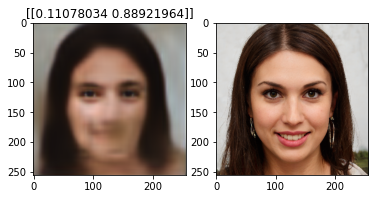

tf.Tensor(
[[[[0.3605761  0.41147026 0.35178533]
   [0.46277356 0.479344   0.4713197 ]
   [0.5384724  0.5434302  0.48052797]
   ...
   [0.5168451  0.5645273  0.54790795]
   [0.4855255  0.48461267 0.4343351 ]
   [0.35278296 0.44442177 0.30230704]]

  [[0.44348037 0.4567039  0.42125475]
   [0.5362803  0.5152664  0.51703286]
   [0.5691305  0.5633087  0.5235588 ]
   ...
   [0.5542293  0.54389703 0.55399203]
   [0.59376234 0.5555577  0.5436914 ]
   [0.46270388 0.51437736 0.44564682]]

  [[0.50976956 0.543604   0.52447927]
   [0.56663364 0.58715653 0.5846896 ]
   [0.59014827 0.5983424  0.5751279 ]
   ...
   [0.5992009  0.60438573 0.5816426 ]
   [0.62629706 0.6022867  0.5598242 ]
   [0.5429138  0.56206036 0.50143063]]

  ...

  [[0.5378963  0.5170299  0.4857964 ]
   [0.54528034 0.51157534 0.46787384]
   [0.49432105 0.4650088  0.42721254]
   ...
   [0.53040516 0.44712868 0.4028202 ]
   [0.49904794 0.43527    0.3913636 ]
   [0.39617532 0.36073974 0.30294502]]

  [[0.4961664  0.42943954 0.410436

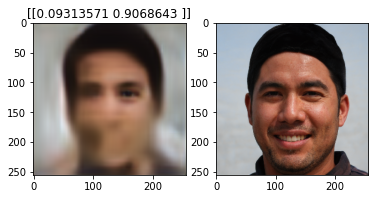

tf.Tensor(
[[[[0.3691423  0.42348644 0.36374888]
   [0.47354627 0.49249914 0.48636985]
   [0.55074376 0.5585611  0.495162  ]
   ...
   [0.5280241  0.57693076 0.5604541 ]
   [0.49214143 0.4917298  0.44364393]
   [0.35650623 0.4486569  0.3066582 ]]

  [[0.45619893 0.4699597  0.43558812]
   [0.550039   0.52959156 0.5328599 ]
   [0.58397275 0.5796163  0.53951895]
   ...
   [0.56578773 0.55701506 0.5668296 ]
   [0.6017553  0.56299174 0.55444354]
   [0.46647888 0.5200881  0.4503684 ]]

  [[0.52591157 0.5620823  0.54400474]
   [0.58395416 0.6061739  0.6050033 ]
   [0.60764974 0.6180798  0.59470886]
   ...
   [0.6129712  0.61772454 0.5963599 ]
   [0.6351658  0.6116239  0.57074374]
   [0.5477353  0.5678061  0.5071528 ]]

  ...

  [[0.53978026 0.52531266 0.4987849 ]
   [0.5381112  0.52316713 0.49659482]
   [0.50526774 0.48970068 0.4684037 ]
   ...
   [0.40362334 0.38710433 0.3619332 ]
   [0.4155187  0.39075112 0.3560852 ]
   [0.3674453  0.34927005 0.3008073 ]]

  [[0.49937105 0.4398427  0.424517

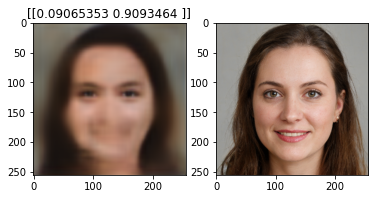

tf.Tensor(
[[[[0.32276875 0.36061287 0.2935812 ]
   [0.40766853 0.41291073 0.38785836]
   [0.46787065 0.45996732 0.389251  ]
   ...
   [0.3969143  0.41935655 0.38878638]
   [0.38034505 0.36584297 0.3074547 ]
   [0.2770832  0.34272647 0.22156844]]

  [[0.39417332 0.40299714 0.35268903]
   [0.46645302 0.4429845  0.4212787 ]
   [0.4869188  0.47396955 0.41703174]
   ...
   [0.42528397 0.4015281  0.3900116 ]
   [0.46426666 0.418365   0.3884509 ]
   [0.36732203 0.39074758 0.3317416 ]]

  [[0.44479126 0.46642917 0.4296259 ]
   [0.48141015 0.48780647 0.46108848]
   [0.49338973 0.48371553 0.4439865 ]
   ...
   [0.45507872 0.44316256 0.4129999 ]
   [0.48594797 0.44713822 0.399468  ]
   [0.4231056  0.4236194  0.37036747]]

  ...

  [[0.45285684 0.4364338  0.39897922]
   [0.45630592 0.4252466  0.38157406]
   [0.41260213 0.38500905 0.35165343]
   ...
   [0.34500283 0.31063995 0.2585247 ]
   [0.35495102 0.31256172 0.2583151 ]
   [0.31173205 0.28033325 0.22780298]]

  [[0.41803098 0.36700645 0.340485

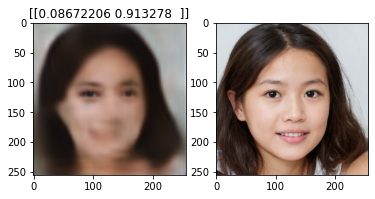

tf.Tensor(
[[[[0.397565   0.46436182 0.40606514]
   [0.5072339  0.53772056 0.53921795]
   [0.5892074  0.6081501  0.5456264 ]
   ...
   [0.60763484 0.6791204  0.67856765]
   [0.5602131  0.5719503  0.5317427 ]
   [0.40970862 0.51862407 0.36247447]]

  [[0.49810386 0.517596   0.48868746]
   [0.5959743  0.58173025 0.59339   ]
   [0.6306105  0.63599    0.59910923]
   ...
   [0.64870256 0.6504749  0.69099987]
   [0.69013876 0.6516942  0.6662654 ]
   [0.52990246 0.6086445  0.5297081 ]]

  [[0.5831135  0.6312758  0.6207387 ]
   [0.64542866 0.6802734  0.6899827 ]
   [0.66689056 0.69311786 0.67672443]
   ...
   [0.7095817  0.73664546 0.7299214 ]
   [0.73587143 0.7213963  0.6967158 ]
   [0.6347291  0.6701164  0.60520196]]

  ...

  [[0.4878589  0.47305155 0.4293103 ]
   [0.4715457  0.4528224  0.40683153]
   [0.428607   0.40873963 0.38327867]
   ...
   [0.6142687  0.6250274  0.65986735]
   [0.6148227  0.61126626 0.63299584]
   [0.5350328  0.5306877  0.49990267]]

  [[0.45356125 0.39972842 0.370119

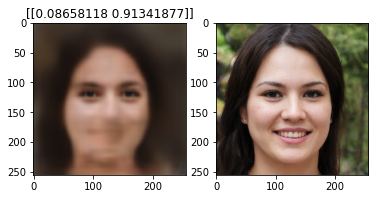

tf.Tensor(
[[[[0.20570414 0.22400099 0.14559817]
   [0.2497387  0.23812708 0.17963232]
   [0.27107722 0.24324489 0.16947003]
   ...
   [0.26644856 0.26097402 0.2184989 ]
   [0.26363063 0.23829307 0.17199679]
   [0.19554868 0.2330072  0.13573384]]

  [[0.2564533  0.25337118 0.18374677]
   [0.28872633 0.25500184 0.19887717]
   [0.2794392  0.24966009 0.18523349]
   ...
   [0.28397596 0.24210377 0.21543594]
   [0.320382   0.26428205 0.22286665]
   [0.26296636 0.25647342 0.2078986 ]]

  [[0.28167206 0.2755114  0.21493408]
   [0.30024981 0.2654696  0.21726458]
   [0.2881692  0.2487975  0.20978042]
   ...
   [0.29567924 0.2721727  0.23858948]
   [0.32864732 0.27495557 0.23449525]
   [0.29228607 0.27164266 0.23203503]]

  ...

  [[0.31702435 0.29922935 0.24181195]
   [0.31604016 0.27277046 0.22937745]
   [0.2975136  0.25193158 0.21576095]
   ...
   [0.26393914 0.24947855 0.23238541]
   [0.28613913 0.25368762 0.23234169]
   [0.26094228 0.24474655 0.20385876]]

  [[0.3075217  0.26878572 0.219323

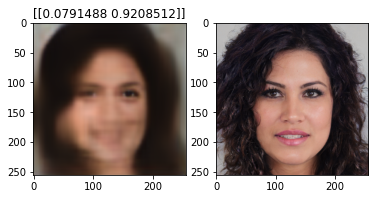

tf.Tensor(
[[[[0.39119917 0.45373145 0.39574474]
   [0.49903482 0.5248095  0.5249652 ]
   [0.5789671  0.59246624 0.5305801 ]
   ...
   [0.50400573 0.54798007 0.5277243 ]
   [0.4732455  0.46982938 0.41760975]
   [0.3443938  0.4308006  0.29161027]]

  [[0.48746073 0.5052444  0.4753089 ]
   [0.5831517  0.5664071  0.5763858 ]
   [0.6164151  0.61809576 0.5812594 ]
   ...
   [0.5430217  0.52996194 0.5338497 ]
   [0.5794326  0.5399215  0.5237806 ]
   [0.45101333 0.4997299  0.431142  ]]

  [[0.5660836  0.61131966 0.5995563 ]
   [0.62423146 0.656765   0.66396374]
   [0.6429165  0.66654134 0.6492307 ]
   ...
   [0.5892897  0.59118617 0.56520534]
   [0.6140902  0.5873611  0.5426652 ]
   [0.53120905 0.5476502  0.48732418]]

  ...

  [[0.5683164  0.5501642  0.51805264]
   [0.5586887  0.5389091  0.5009378 ]
   [0.5083399  0.49209052 0.46508545]
   ...
   [0.26135546 0.22920825 0.17478585]
   [0.27586144 0.22863686 0.17558712]
   [0.24814019 0.21640822 0.16255595]]

  [[0.529375   0.4629994  0.443041

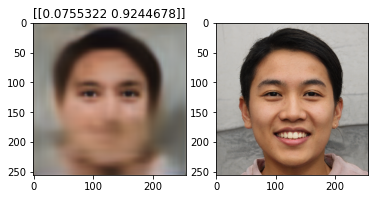

tf.Tensor(
[[[[0.35047245 0.39774117 0.33458832]
   [0.4459591  0.4585804  0.4437376 ]
   [0.51508206 0.5152668  0.44795433]
   ...
   [0.50906986 0.5553888  0.5372313 ]
   [0.47700983 0.47553185 0.42566386]
   [0.3461548  0.43525845 0.2956695 ]]

  [[0.43072975 0.44268718 0.40097958]
   [0.5145592  0.49217594 0.48386627]
   [0.5414495  0.5324583  0.48445994]
   ...
   [0.54548067 0.5357044  0.5443568 ]
   [0.5832519  0.5446912  0.53374356]
   [0.45341802 0.5038078  0.4360402 ]]

  [[0.49195015 0.5211104  0.49507907]
   [0.5380289  0.5532806  0.539855  ]
   [0.5536958  0.5545354  0.52257353]
   ...
   [0.58879584 0.5935283  0.5718002 ]
   [0.6141176  0.5899266  0.54873955]
   [0.5309796  0.550001   0.49028543]]

  ...

  [[0.5822271  0.5676111  0.5491019 ]
   [0.5875161  0.5746871  0.5503028 ]
   [0.55493516 0.542711   0.51760364]
   ...
   [0.48229647 0.49717048 0.50856465]
   [0.49747032 0.49643117 0.4895943 ]
   [0.44542563 0.4408071  0.39941117]]

  [[0.5392493  0.47348976 0.466364

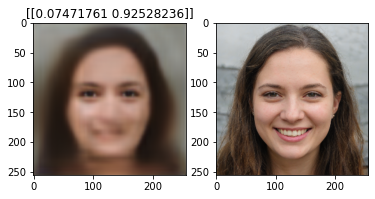

tf.Tensor(
[[[[0.37220818 0.42778033 0.3698471 ]
   [0.47763824 0.49870035 0.49532565]
   [0.5560373  0.56560946 0.50475496]
   ...
   [0.4898458  0.53196037 0.51296324]
   [0.46213412 0.45857924 0.4068641 ]
   [0.33626515 0.4223844  0.28507453]]

  [[0.46010262 0.47495577 0.44365358]
   [0.555696   0.5368229  0.5445994 ]
   [0.58951586 0.58735085 0.55189496]
   ...
   [0.5229255  0.5109035  0.518014  ]
   [0.564615   0.5247439  0.5105718 ]
   [0.44077218 0.48779163 0.42090097]]

  [[0.5320362  0.57042074 0.55638665]
   [0.5920956  0.6174699  0.62224436]
   [0.61571145 0.630304   0.61294   ]
   ...
   [0.561255   0.56466496 0.5434552 ]
   [0.5920331  0.56554866 0.5237661 ]
   [0.514448   0.5312979  0.4727726 ]]

  ...

  [[0.35466212 0.33505294 0.2837203 ]
   [0.33603078 0.3031307  0.26643178]
   [0.31020433 0.2761735  0.25499228]
   ...
   [0.3409853  0.30345592 0.25240445]
   [0.34947002 0.30493128 0.25218362]
   [0.30546373 0.27270877 0.22049576]]

  [[0.32954043 0.2922148  0.250473

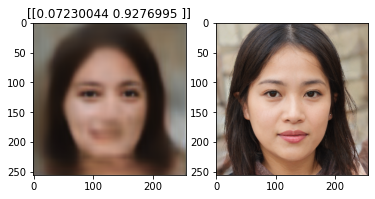

tf.Tensor(
[[[[0.32247555 0.36037078 0.29346898]
   [0.40732807 0.412592   0.38784885]
   [0.46765012 0.45983163 0.38919804]
   ...
   [0.40263176 0.42321482 0.39213514]
   [0.38547945 0.37012511 0.3114753 ]
   [0.28007728 0.3460696  0.22455154]]

  [[0.39430332 0.40295702 0.35297963]
   [0.46682453 0.44322455 0.4220113 ]
   [0.48784828 0.47467935 0.41821864]
   ...
   [0.4339863  0.40638408 0.39283076]
   [0.4707058  0.42502847 0.39230198]
   [0.37155402 0.3952313  0.3355858 ]]

  [[0.44553697 0.46681452 0.4303681 ]
   [0.482535   0.4888481  0.46272245]
   [0.49529028 0.48561117 0.44574127]
   ...
   [0.46521288 0.44824815 0.41543546]
   [0.4936518  0.45293444 0.4017734 ]
   [0.42850244 0.42845777 0.37400532]]

  ...

  [[0.45720506 0.44043592 0.39690107]
   [0.4451757  0.42204595 0.38282046]
   [0.40717018 0.38425738 0.3610514 ]
   ...
   [0.5271976  0.4478927  0.40061605]
   [0.4974206  0.43445238 0.38776633]
   [0.39859128 0.36192128 0.30463243]]

  [[0.42619896 0.37856153 0.345586

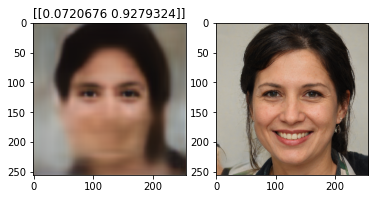

tf.Tensor(
[[[[0.3168168  0.35345343 0.285084  ]
   [0.3988709  0.40330654 0.3755118 ]
   [0.456868   0.44791576 0.37579748]
   ...
   [0.40926182 0.42978925 0.39772344]
   [0.3900879  0.37410584 0.31537184]
   [0.28287005 0.34845856 0.22659373]]

  [[0.3871187  0.39568657 0.34285298]
   [0.4560218  0.4327981  0.4074765 ]
   [0.47464782 0.4615084  0.40165177]
   ...
   [0.4443118  0.41528282 0.3984143 ]
   [0.47694284 0.43129075 0.39656824]
   [0.37450284 0.39961419 0.33858767]]

  [[0.43608612 0.45655024 0.41689453]
   [0.4695378  0.47446552 0.44446984]
   [0.48026717 0.46887422 0.42785883]
   ...
   [0.47949344 0.4596432  0.42347202]
   [0.5035418  0.4610204  0.40729222]
   [0.4342056  0.43408436 0.37819377]]

  ...

  [[0.5456699  0.5319532  0.5075692 ]
   [0.5464191  0.53230286 0.5069865 ]
   [0.51416814 0.4998034  0.47830454]
   ...
   [0.23485789 0.20762049 0.17512882]
   [0.25421894 0.2118437  0.17821784]
   [0.22582185 0.19389138 0.14695089]]

  [[0.50492716 0.44489375 0.431884

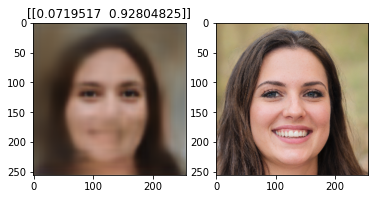

tf.Tensor(
[[[[0.26913375 0.29620504 0.21970926]
   [0.3328097  0.32720715 0.28117955]
   [0.374636   0.35469994 0.27442908]
   ...
   [0.36630458 0.379831   0.34488574]
   [0.3518058  0.33351958 0.27322307]
   [0.25573957 0.313889   0.19957218]]

  [[0.33228564 0.335653   0.26859018]
   [0.3811174  0.35218945 0.30297983]
   [0.38888282 0.36567143 0.2910537 ]
   ...
   [0.3931465  0.36320528 0.34377897]
   [0.4290272  0.3809058  0.3453245 ]
   [0.3405307  0.35561326 0.29948273]]

  [[0.3736413  0.37931892 0.31842455]
   [0.3891977  0.37373883 0.3198656 ]
   [0.3904552  0.36098912 0.31132516]
   ...
   [0.41947836 0.39963537 0.36545056]
   [0.44815814 0.40379307 0.35322157]
   [0.38957077 0.38380864 0.33255598]]

  ...

  [[0.3310228  0.30971673 0.25638604]
   [0.31863856 0.28199372 0.24446087]
   [0.2976678  0.2602871  0.23472969]
   ...
   [0.39870352 0.363827   0.31123725]
   [0.40607274 0.3733019  0.31209332]
   [0.3571251  0.3359373  0.27573878]]

  [[0.31077164 0.274938   0.229533

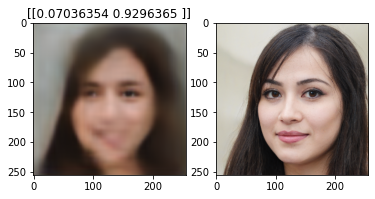

tf.Tensor(
[[[[0.36371112 0.41573635 0.35804203]
   [0.4680298  0.48645326 0.48171267]
   [0.5457707  0.5528966  0.49267894]
   ...
   [0.5311114  0.58110166 0.5660327 ]
   [0.49416655 0.49505153 0.44733357]
   [0.3584441  0.4506352  0.30866164]]

  [[0.44748414 0.4611983  0.42923778]
   [0.5432822  0.5234442  0.5303773 ]
   [0.5776588  0.5737581  0.5389081 ]
   ...
   [0.56829154 0.5612546  0.5741873 ]
   [0.6049513  0.5661601  0.5604177 ]
   [0.46770906 0.5232306  0.45314324]]

  [[0.51601094 0.5517477  0.5367458 ]
   [0.57717437 0.600055   0.6040372 ]
   [0.60314626 0.61469805 0.5975705 ]
   ...
   [0.6150472  0.62269735 0.60272443]
   [0.63766134 0.61540496 0.5765288 ]
   [0.54962677 0.57145    0.5101765 ]]

  ...

  [[0.50044864 0.48801816 0.44875947]
   [0.48877722 0.46555832 0.4227444 ]
   [0.43784094 0.4157074  0.3949254 ]
   ...
   [0.24946667 0.22336525 0.17908032]
   [0.26643488 0.22297177 0.17943983]
   [0.242391   0.21689409 0.1674931 ]]

  [[0.4592588  0.4029949  0.377685

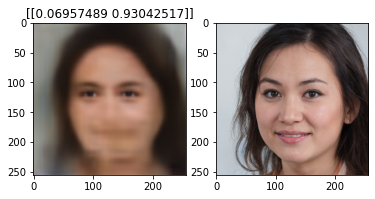

tf.Tensor(
[[[[0.3661853  0.41950375 0.35942352]
   [0.46885294 0.48693293 0.47946823]
   [0.54446703 0.5508319  0.48723856]
   ...
   [0.60072845 0.67421985 0.676415  ]
   [0.5595281  0.5720991  0.53023475]
   [0.4101507  0.5220475  0.36356914]]

  [[0.45199668 0.46590355 0.43064862]
   [0.5439456  0.5234256  0.5252307 ]
   [0.5756934  0.5709653  0.5304208 ]
   ...
   [0.64246815 0.6431755  0.68620217]
   [0.69007385 0.65122986 0.66478163]
   [0.5339429  0.6114119  0.5335093 ]]

  [[0.5202669  0.5557699  0.5370856 ]
   [0.5753066  0.59731853 0.5948433 ]
   [0.5958598  0.6060226  0.58231133]
   ...
   [0.7007495  0.7274369  0.7238519 ]
   [0.73522073 0.72173405 0.6953559 ]
   [0.63888    0.6740345  0.6092783 ]]

  ...

  [[0.64119554 0.62843513 0.62002665]
   [0.6468579  0.63937616 0.62324107]
   [0.60946965 0.6062634  0.58404005]
   ...
   [0.15266556 0.12055647 0.10479767]
   [0.17548327 0.12503476 0.10691401]
   [0.17050911 0.13818249 0.10662118]]

  [[0.59294266 0.521484   0.524158

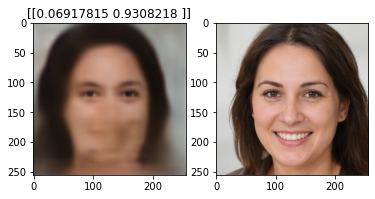

tf.Tensor(
[[[[0.39351696 0.45903522 0.39973554]
   [0.50181794 0.53065014 0.5299216 ]
   [0.5820564  0.59936213 0.5354831 ]
   ...
   [0.52296776 0.5724969  0.5575735 ]
   [0.490732   0.4912787  0.44164726]
   [0.3567015  0.44987732 0.3069583 ]]

  [[0.49318975 0.5114048  0.48089713]
   [0.58906597 0.57338464 0.5820448 ]
   [0.62317824 0.62611914 0.5868459 ]
   ...
   [0.55966663 0.55123734 0.5643165 ]
   [0.6005398  0.56230056 0.5532209 ]
   [0.46695638 0.52131236 0.45174757]]

  [[0.57625854 0.6221278  0.6087896 ]
   [0.6369274  0.66819227 0.6738532 ]
   [0.65770686 0.67965984 0.65950084]
   ...
   [0.60429174 0.6122631  0.59149235]
   [0.6323674  0.60943675 0.5688557 ]
   [0.5480757  0.56912124 0.50815874]]

  ...

  [[0.38157856 0.36193842 0.31312624]
   [0.38082814 0.34773725 0.30334687]
   [0.35472554 0.31997162 0.28570145]
   ...
   [0.49792004 0.49815804 0.49585903]
   [0.50563246 0.49482244 0.4782607 ]
   [0.44492948 0.43339583 0.39077333]]

  [[0.36103803 0.31977734 0.277531

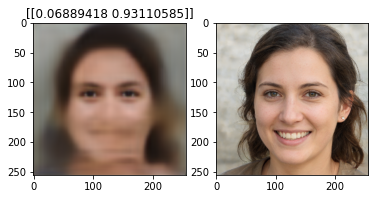

tf.Tensor(
[[[[0.3721298  0.42767486 0.36953366]
   [0.47788525 0.49892083 0.49533486]
   [0.5566149  0.56648266 0.5051775 ]
   ...
   [0.50843304 0.55271244 0.53440756]
   [0.47581053 0.47338867 0.42376179]
   [0.34497958 0.43332604 0.29450837]]

  [[0.45997143 0.47469532 0.44304603]
   [0.55594325 0.5370376  0.5443721 ]
   [0.59045506 0.5883199  0.5521061 ]
   ...
   [0.5443749  0.5330298  0.54016066]
   [0.5814132  0.54214513 0.53012097]
   [0.45144272 0.50122166 0.43312427]]

  [[0.53189033 0.5700656  0.555509  ]
   [0.5926133  0.6176635  0.6217559 ]
   [0.61740667 0.63141525 0.6131983 ]
   ...
   [0.58645266 0.58903515 0.5663839 ]
   [0.6113631  0.58611643 0.5435274 ]
   [0.52817345 0.5461924  0.48670888]]

  ...

  [[0.41127956 0.39866576 0.35334963]
   [0.38882846 0.36994195 0.3360736 ]
   [0.3513778  0.3336558  0.32256144]
   ...
   [0.4573992  0.41779897 0.39382252]
   [0.45437646 0.41581687 0.3864806 ]
   [0.38783336 0.36275968 0.3150041 ]]

  [[0.3778786  0.34115547 0.306285

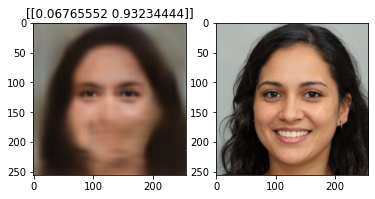

tf.Tensor(
[[[[0.33983433 0.38377273 0.31978077]
   [0.4318081  0.4423384  0.42462498]
   [0.49845964 0.4965124  0.4286481 ]
   ...
   [0.4415288  0.47204036 0.44486964]
   [0.41951525 0.4088133  0.35320452]
   [0.30453658 0.37904328 0.25028557]]

  [[0.41699827 0.42838445 0.38430598]
   [0.49811834 0.47615778 0.46451825]
   [0.52365065 0.5142815  0.46462065]
   ...
   [0.4751653  0.45472887 0.44823804]
   [0.51222837 0.46973598 0.44415987]
   [0.40187722 0.4352371  0.3727826 ]]

  [[0.47576278 0.5026231  0.47403923]
   [0.520375   0.53379035 0.51790136]
   [0.5367416  0.53507364 0.50174296]
   ...
   [0.5113794  0.5027111  0.47418305]
   [0.5385726  0.5040467  0.45665133]
   [0.46602017 0.47343597 0.4171144 ]]

  ...

  [[0.53772926 0.5084326  0.4678903 ]
   [0.5347174  0.498406   0.44569406]
   [0.48602968 0.44904965 0.4051802 ]
   ...
   [0.1962786  0.16255614 0.1266068 ]
   [0.21036807 0.16137913 0.1253945 ]
   [0.19065924 0.16659789 0.11483376]]

  [[0.50439733 0.43331525 0.402100

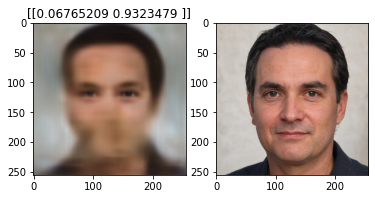

tf.Tensor(
[[[[0.35565966 0.4055146  0.34285578]
   [0.45284587 0.46774063 0.45462027]
   [0.52345484 0.525919   0.45912415]
   ...
   [0.5422682  0.5948131  0.58226717]
   [0.5058976  0.5081805  0.46048132]
   [0.36714846 0.46373498 0.3183169 ]]

  [[0.43828547 0.45139202 0.41098312]
   [0.523887   0.502421   0.4962866 ]
   [0.5515231  0.5441544  0.49741316]
   ...
   [0.5793369  0.57285213 0.58865535]
   [0.6190797  0.5806843  0.5755254 ]
   [0.47980696 0.5380863  0.4666678 ]]

  [[0.5021872  0.5339323  0.5094402 ]
   [0.5499963  0.5678694  0.55677164]
   [0.566009   0.57010317 0.5396883 ]
   ...
   [0.62752503 0.6367346  0.6172758 ]
   [0.6529124  0.6308497  0.5921854 ]
   [0.5644593  0.5871985  0.5255208 ]]

  ...

  [[0.5056467  0.49551004 0.46541753]
   [0.50570893 0.48857966 0.45377505]
   [0.47047842 0.44903964 0.42876205]
   ...
   [0.26761225 0.25889552 0.23781478]
   [0.29490912 0.26582974 0.2392442 ]
   [0.27497405 0.25964177 0.21818747]]

  [[0.45911628 0.40110207 0.384384

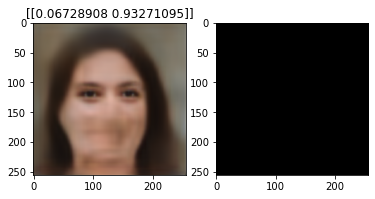

tf.Tensor(
[[[[0.27820536 0.30713522 0.23218918]
   [0.34550428 0.34182093 0.29925412]
   [0.39036888 0.3727121  0.29385528]
   ...
   [0.4173512  0.44329268 0.41475934]
   [0.39906257 0.38635522 0.32899576]
   [0.29063347 0.36032546 0.23559977]]

  [[0.34258556 0.3472289  0.28264168]
   [0.39554888 0.36761475 0.32271698]
   [0.40542537 0.3843207  0.3118623 ]
   ...
   [0.4483018  0.42535982 0.41729525]
   [0.4874041  0.44318357 0.41492125]
   [0.3842911  0.41254318 0.35170034]]

  [[0.3854912  0.39408922 0.3370387 ]
   [0.40418035 0.39289597 0.34130675]
   [0.40597713 0.38009793 0.33143526]
   ...
   [0.48019493 0.46962783 0.4406092 ]
   [0.51055354 0.47419915 0.42632258]
   [0.44406778 0.448132   0.3930978 ]]

  ...

  [[0.3419696  0.3143393  0.2604182 ]
   [0.3451268  0.29951382 0.25511   ]
   [0.3275594  0.27930525 0.23788096]
   ...
   [0.39755297 0.3654959  0.31858867]
   [0.40516996 0.3679258  0.3171933 ]
   [0.35600072 0.32764158 0.27523825]]

  [[0.32704228 0.2827647  0.233136

In [33]:
for iter in range(20):

    if vals[iter] < len(train_image):
        plt.figure()
        plt.subplot(1,2,1)
        plt.imshow(tf.squeeze(editor(tf.reshape(gen_images[vals[iter]],(-1,256,256,3))) ))
        plt.title(preds[vals[iter]])
        plt.subplot(1,2,2)
        plt.imshow(train_image[vals[iter]])
        plt.show()
    print(editor(tf.reshape(gen_images[vals[iter]],(-1,256,256,3))))

Not enough resoucres on kaggle to run this - training editing module to improve over generator.
we try mixing a few losses - psnr is sensitive to "worst-case", discLoss is the distriminator and doesnt account for changes, and mse is there to make sure it doesn't run to infinity or negatives.

In [34]:
if False:
    mask_array_edit_tr,mask_array_edit_te,mask_array_edit = edit_images(mask_array)
    for iter in range(10): 
        model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-6), loss = psnrLoss,
                  metrics = ['acc'])
        model.fit(mask_array_edit_tr, train_image, epochs = 5,shuffle='True',validation_split = 0.2)
        
        model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-6), loss = discLoss,
                     metrics = ['acc'])
        model.fit(mask_array_edit_tr, train_image, epochs = 5,shuffle='True',validation_split = 0.2, 
                  batch_size=16)
        
        model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-5), loss = 'mse',
                  metrics = ['acc'])
        model.fit(mask_array_edit_tr, train_image, epochs = 5,validation_split = 0.2,shuffle='True')
        plot_images(50,55)
    plot_images(20,30)

## plotting images

Here we test performance over real-life images

In [35]:
def plot_images(start = 0, end = 5):
    for i in range(start, end, 1):
        plt.figure(figsize = (10,10))
        plt.subplot(1,3,1)
        plt.title("No Mask", fontsize = 12)
        plt.imshow(test_image[i])
        plt.subplot(1,3,2)
        plt.title("Mask", fontsize = 12)
        plt.imshow(test_mask_image[i])
        plt.subplot(1,3,3)
        plt.title("Predicted", fontsize = 12)
        prediction = model.predict(test_mask_image[i].reshape(1,SIZE, SIZE, 3)).reshape(SIZE, SIZE, 3)
        plt.imshow(prediction)
        plt.show()
        

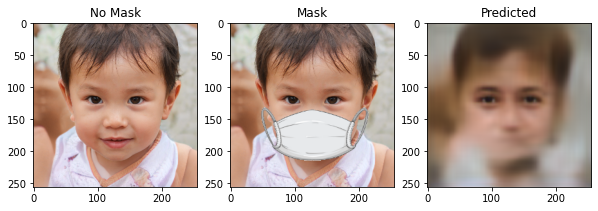

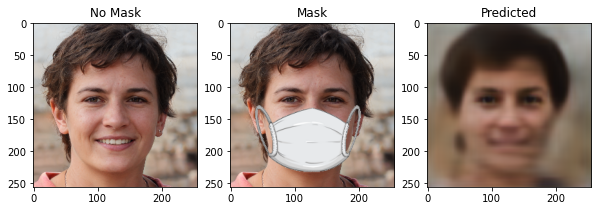

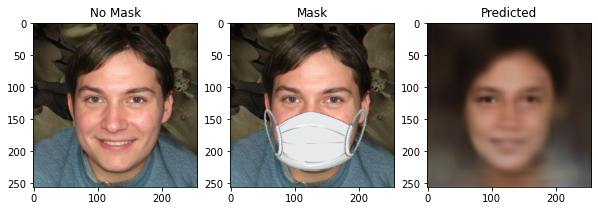

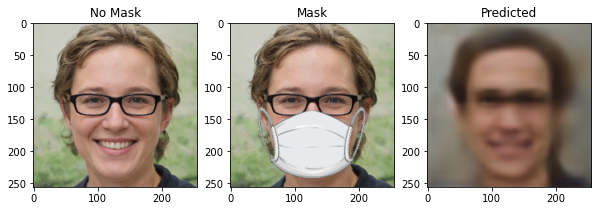

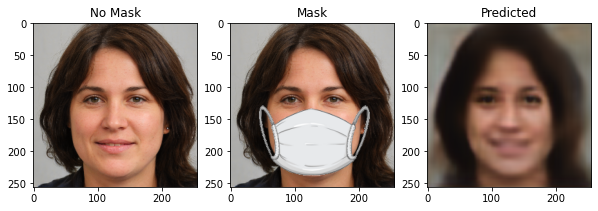

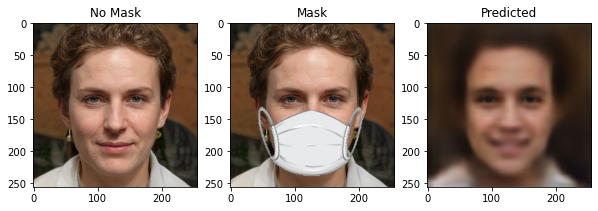

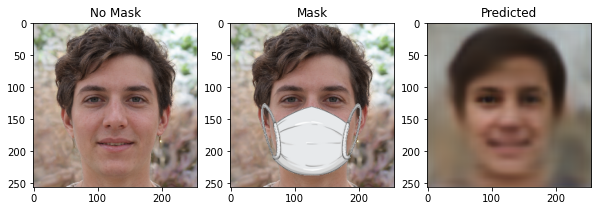

In [36]:
plot_images(5,12)

In [37]:

'''
mask_path = '../input/toker2/'
mask_array = []


mask_file = sorted_alphanumeric(os.listdir(mask_path))
for i in tqdm(mask_file):
    image = cv2.imread(mask_path + '/' + i,1)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (SIZE, SIZE))
    image = image.astype('float32') / 255.0
    mask_array.append(img_to_array(image))
    
'''


"\nmask_path = '../input/toker2/'\nmask_array = []\n\n\nmask_file = sorted_alphanumeric(os.listdir(mask_path))\nfor i in tqdm(mask_file):\n    image = cv2.imread(mask_path + '/' + i,1)\n    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)\n    image = cv2.resize(image, (SIZE, SIZE))\n    image = image.astype('float32') / 255.0\n    mask_array.append(img_to_array(image))\n    \n"

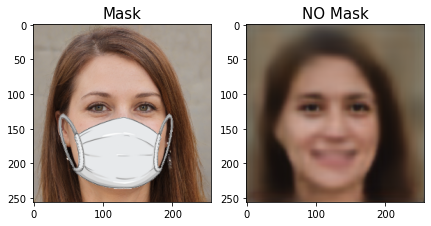

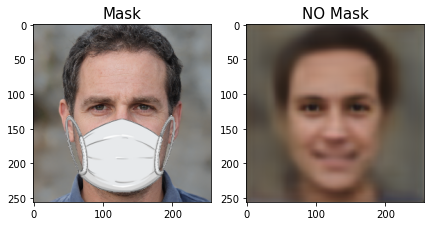

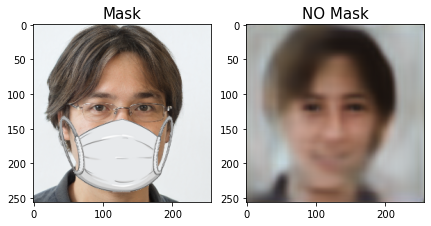

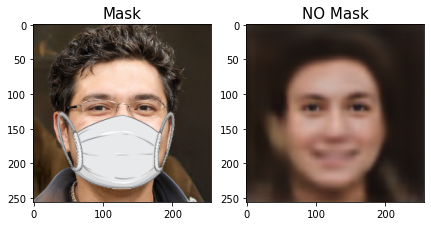

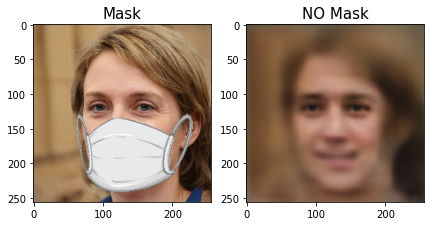

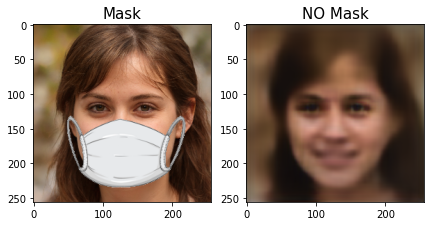

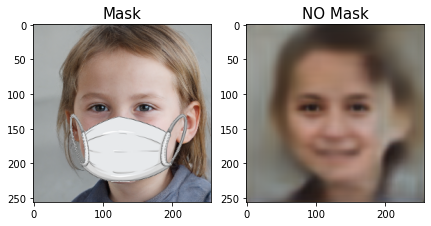

In [38]:
def plot_image_pair(images = 1):
    for i in range(images):
        plt.figure(figsize = (7,7))
        plt.subplot(1,2,1)
        plt.title("Mask", fontsize = 15)
        plt.imshow(mask_array[i].reshape(SIZE, SIZE, 3))
        plt.subplot(1,2,2)
        plt.title("NO Mask", fontsize = 15)
        plt.imshow(model.predict(mask_array[i].reshape(1,SIZE, SIZE, 3)).reshape(SIZE, SIZE, 3))

        
        
        
plot_image_pair(7)

In [39]:
if 0:
    import os
    os.chdir(r'/kaggle/working/comps')
    print(os.listdir())
    import shutil
    shutil.make_archive('comparison', 'zip', os.getcwd())

In [40]:
if  0: 
    from IPython.display import FileLink
    FileLink(r'./comparison.zip')

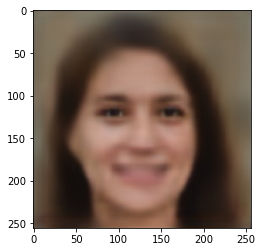

In [41]:
prediction = model.predict(mask_array[0].reshape(1,SIZE, SIZE, 3)).reshape(SIZE, SIZE, 3)
plt.imshow(prediction)

# Thanks for your visit